In [1]:
import os
import sys
main_dir = '../'
main_dir2 = '../../OQSPlots'
sys.path.append(main_dir)
sys.path.append(main_dir2)

import time

import numpy as np
import scipy.ndimage as sn
from scipy.optimize import minimize, minimize_scalar
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp
from functools import lru_cache
import tqdm

import cmasher as cmr
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib.offsetbox import AnchoredText
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


import opennu as on
from qutip import *
from qutip import piqs
import run

plt.style.use(main_dir+'sty.mplstyle')
cols = ['#0C5DA5', '#00B945', '#FF9500', '#FF2C00', '#845B97', '#474747', '#9e9e9e']

In [2]:
def myBloch(col='#004f98'):
    b = Bloch()
    b.figsize = (6, 6)
    b.sphere_color = [0.99, 0.99, 0.99]
    b.sphere_alpha = 0.35
    b.frame_width = 0.6
    b.frame_alpha = 0.05
    b.zlabel = ('z', '')
    b.xlpos = (1.55, -1.55)
    b.ylpos = (1.2, -1.2)
    b.zlpos = (1.2, -1.25)
    b.vector_width = 3.5
    b.vector_length = 0.1
    b.vector_color = [col]
    b.point_color = ['k']
    return b

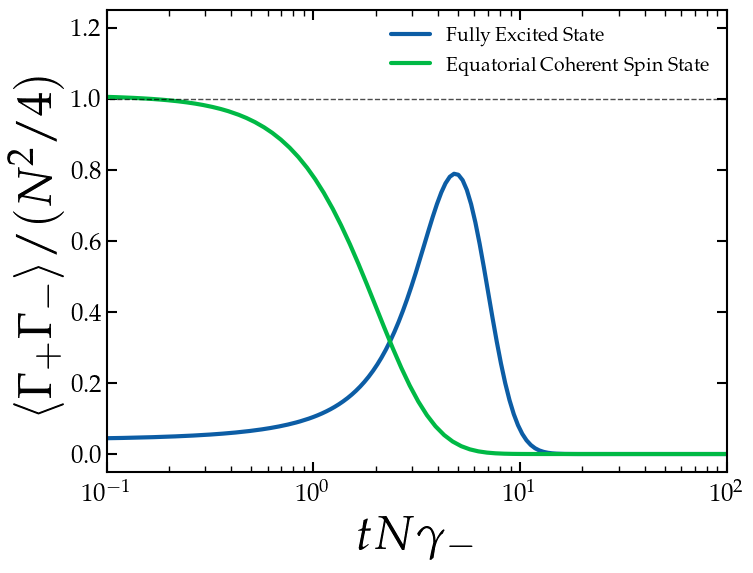

In [3]:
n = 100
path  = main_dir+f'../OpenNu/output/N%d'%n


# data contains (t, Jx, Jy, Jz, Jx^2, Jy^2, Jz^2, Jpm, Jmp, J)
dataP = np.loadtxt(path+f'/Product_RK4_h0.1_g0.00.txt')
dataE = np.loadtxt(path+f'/Excited_RK4_h0.1_g0.00.txt')

dataP1 = np.loadtxt(path+f'/Product_RK4_h0.1_g0.50.txt')
dataE1 = np.loadtxt(path+f'/Excited_RK4_h0.1_g0.50.txt')

Gmax = n*(n+1)/4
Gmax = n**2/4

fig, ax = plt.subplots(1,1,figsize=(8,6))

plt.semilogx(dataE[:,0], dataE[:,7]/Gmax, label=r'Fully Excited State')
plt.semilogx(dataP[:,0], dataP[:,7]/Gmax, label=r'Equatorial Coherent Spin State')

plt.semilogx(dataE[:,0],dataE[:,0]/dataE[:,0], c='k', ls='--', alpha=0.7, lw=1)
plt.xlim(1e-1, 100)
plt.ylim(-0.05, 1.25)

plt.xlabel(r'$tN\gamma_-$', )
plt.ylabel(r'$\langle\Gamma_{+}\Gamma_-\rangle/(N^2/4)$', )
plt.legend(fontsize=14, frameon=False, loc=1)
plt.show()

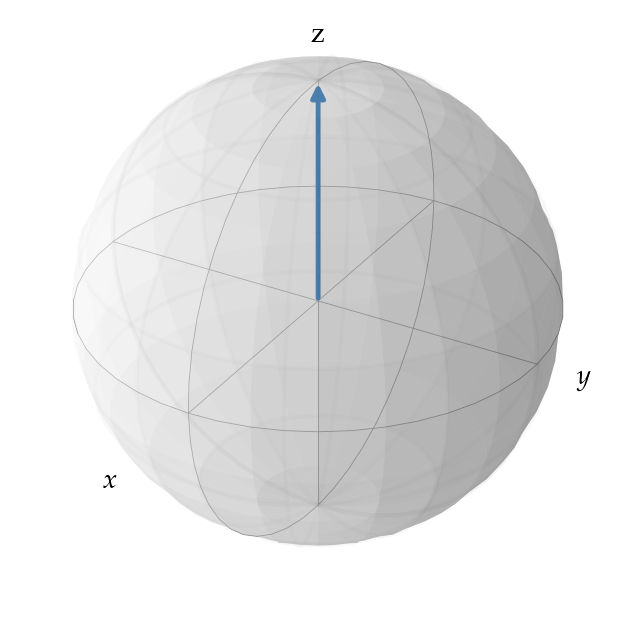

<Figure size 600x600 with 0 Axes>

In [12]:
N = 5
j = N/2

Jx = jmat(j, 'x')
Jy = jmat(j, 'y')
Jz = jmat(j, 'z')

# nframes = 100
#angles = np.linspace(0, 2*np.pi, nframes, endpoint=True)

scale = 0.4
theta = (50 - dataE[:,3]) / (50 - (-50)) * np.pi

out_dir = "bloch_excited"
os.makedirs(out_dir, exist_ok=True)

for i, th in enumerate(theta[:1]):
    fig = plt.figure(figsize=(6, 6)) 
    b = Bloch(fig=fig)                      
    b = myBloch()

    coherent = spin_coherent(j, th, 0)
    xP = expect(Jx, coherent) * scale
    yP = expect(Jy, coherent) * scale
    zP = expect(Jz, coherent) * scale
    b.add_vectors([[xP, yP, zP]])
    b.render()
    b.show()

#### Save figures

In [13]:
# N = 5
# j = N/2

# Jx = jmat(j, 'x')
# Jy = jmat(j, 'y')
# Jz = jmat(j, 'z')

# # nframes = 100
# #angles = np.linspace(0, 2*np.pi, nframes, endpoint=True)

# scale = 0.4
# theta = (50 - dataE[:,3]) / (50 - (-50)) * np.pi

# out_dir = "bloch_excited"
# os.makedirs(out_dir, exist_ok=True)

# for i, th in enumerate(theta):
#     fig = plt.figure(figsize=(6, 6)) 
#     b = Bloch(fig=fig)                      
#     b = myBloch()

#     coherent = spin_coherent(j, th, 0)
#     xP = expect(Jx, coherent) * scale
#     yP = expect(Jy, coherent) * scale
#     zP = expect(Jz, coherent) * scale
#     b.add_vectors([[xP, yP, zP]])
#     b.render()
#     filename = os.path.join(out_dir, f"frame_{i:03d}.png")
#     b.fig.savefig(filename, dpi=362, bbox_inches='tight', pad_inches=0)
#     plt.close(fig)  # avoid memory bloat

In [14]:
# c1 = '#004f98'
# out_dir = "bloch_excited"

# for i, th in enumerate(theta):
#     fig = plt.figure(figsize=(6, 6)) 
#     plt.semilogx(dataE[:i,0], dataE[:i,7]/Gmax, label=r'Fully Excited State', c=c1)
#     plt.scatter(dataE[i, 0], dataE[i, 7]/Gmax, c=c1)
#     plt.xlim(1e-1, 100)
#     plt.ylim(-0.05, 1.25)
    
#     plt.xlabel(r'$tN\gamma_-$', )
#     plt.ylabel(r'$\langle\Gamma_{+}\Gamma_-\rangle/(N^2/4)$', )
#     plt.legend(fontsize=14, frameon=False, loc=1)
#     filename = os.path.join(out_dir, f"right_frame_{i:03d}.png")
#     fig.savefig(filename, dpi=362, bbox_inches='tight', pad_inches=0)
#     #plt.show()

In [65]:
N = 5
j = N/2

Jx = jmat(j, 'x')
Jy = jmat(j, 'y')
Jz = jmat(j, 'z')

# nframes = 100
#angles = np.linspace(0, 2*np.pi, nframes, endpoint=True)

scale = 0.4
theta = (50 - dataP[:,3]) / (50 - (-50)) * np.pi

out_dir = "bloch_coherent"
os.makedirs(out_dir, exist_ok=True)

for i, th in enumerate(theta):
    fig = plt.figure(figsize=(6, 6)) 
    b = Bloch(fig=fig)                      
    b = myBloch('#008000')

    coherent = spin_coherent(j, th, 0)
    xP = expect(Jx, coherent) * scale
    yP = expect(Jy, coherent) * scale
    zP = expect(Jz, coherent) * scale
    b.add_vectors([[xP, yP, zP]])
    b.render()
    filename = os.path.join(out_dir, f"frame_{i:03d}.png")
    b.fig.savefig(filename, dpi=362, bbox_inches='tight', pad_inches=0)
    plt.close(fig)  # avoid memory bloat}

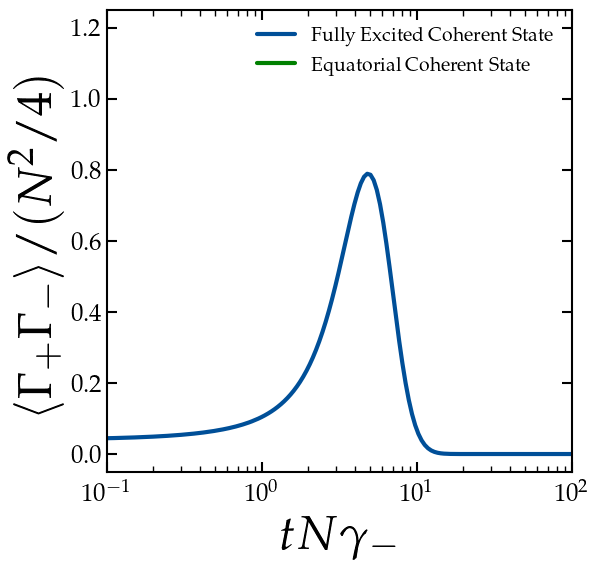

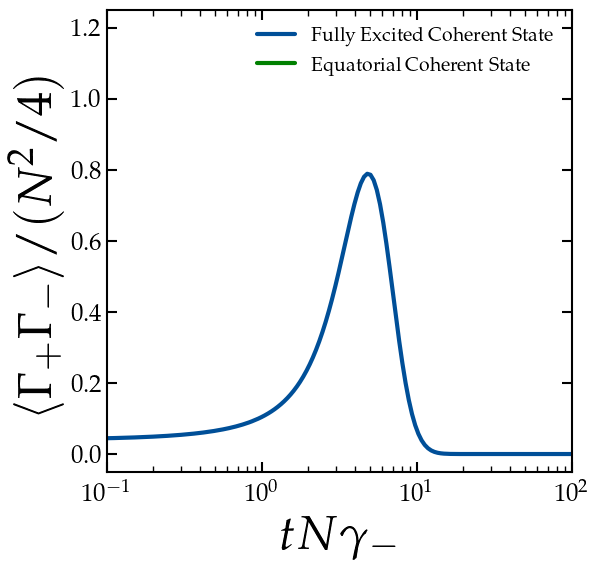

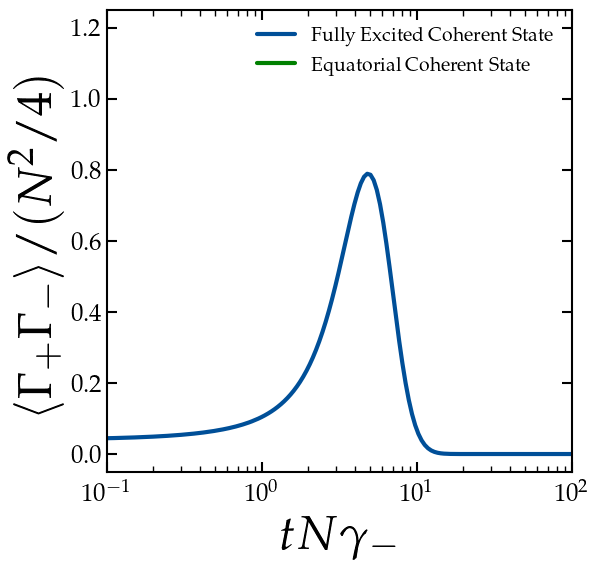

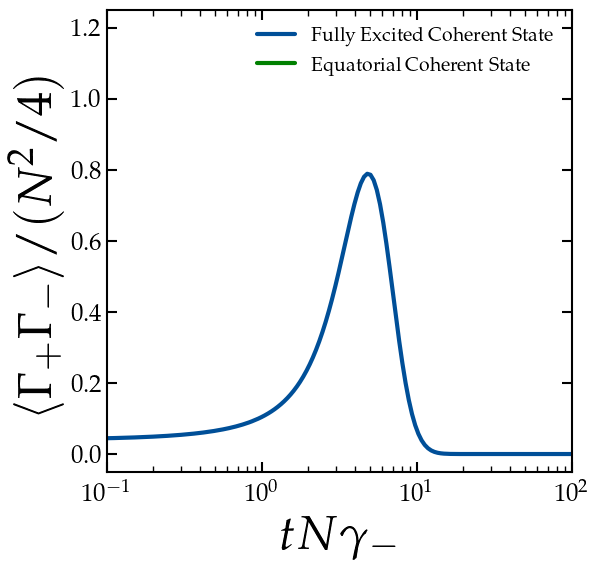

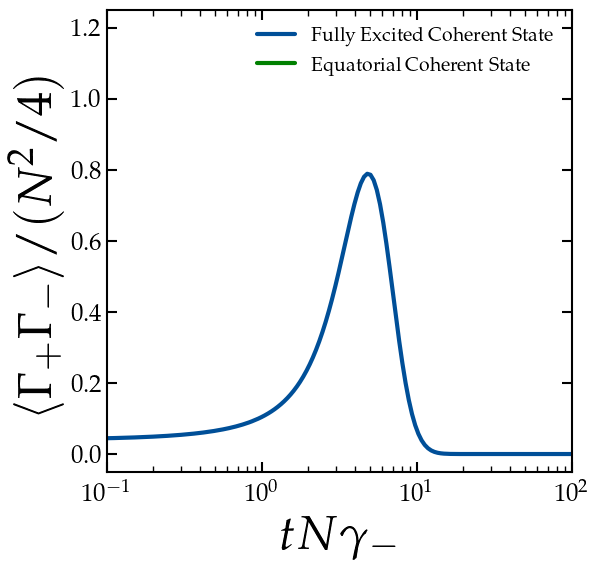

...

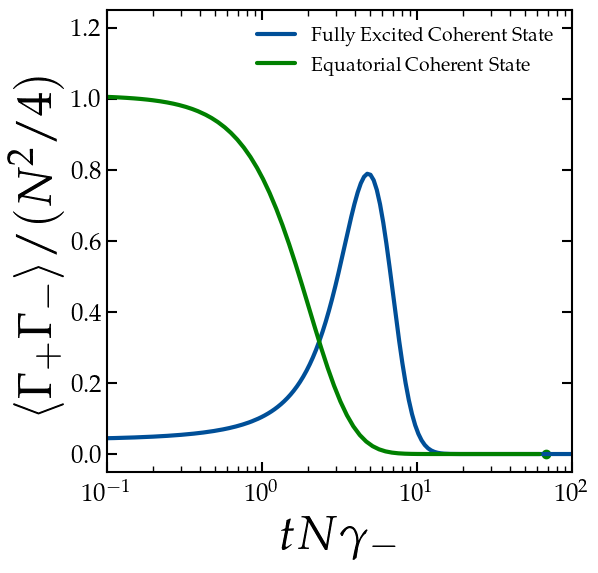

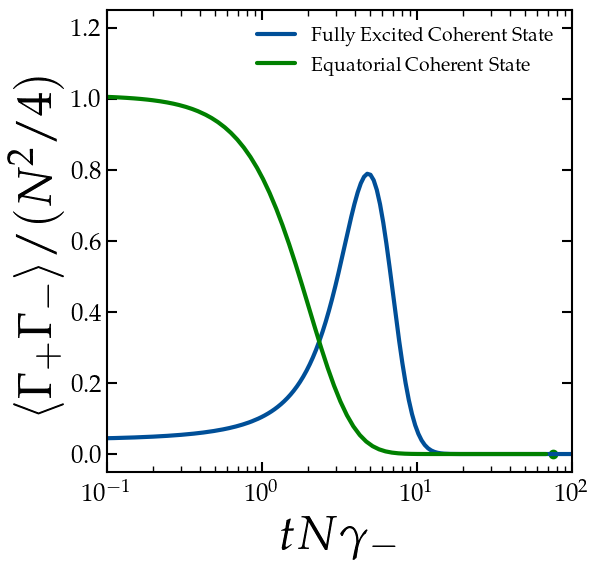

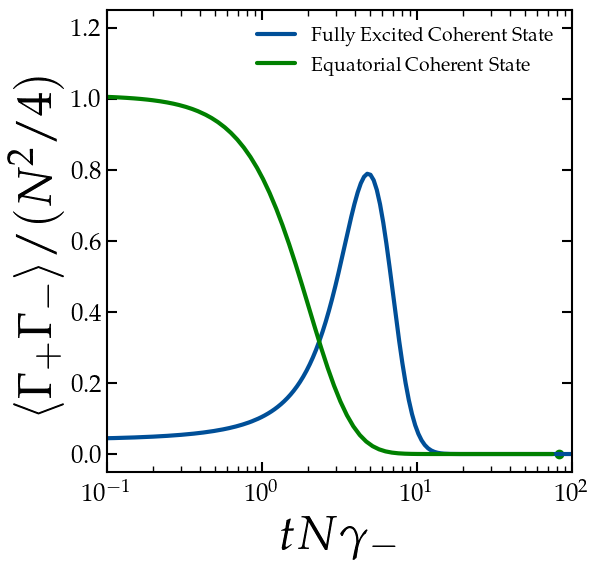

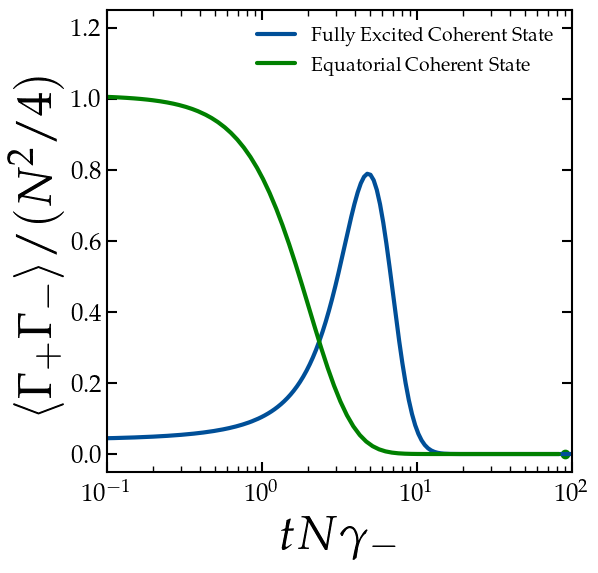

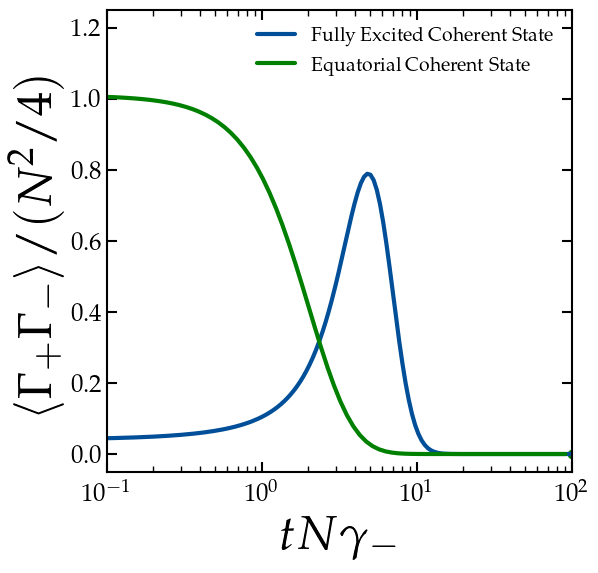

In [67]:
c2  = '#008000'

out_dir = "bloch_coherent"

for i, th in enumerate(theta):
    fig = plt.figure(figsize=(6, 6)) 
    plt.semilogx(dataE[:,0], dataE[:,7]/Gmax, label=r'Fully Excited Coherent State', c=c1)
    plt.semilogx(dataP[:i,0], dataP[:i,7]/Gmax, label=r'Equatorial Coherent State', c=c2)
    plt.scatter(dataP[i, 0], dataP[i, 7]/Gmax, c=c2)
    plt.xlim(1e-1, 100)
    plt.ylim(-0.05, 1.25)
    
    plt.xlabel(r'$tN\gamma_-$', )
    plt.ylabel(r'$\langle\Gamma_{+}\Gamma_-\rangle/(N^2/4)$', )
    plt.legend(fontsize=14, frameon=False, loc=1)
    filename = os.path.join(out_dir, f"right_frame_{i:03d}.png")
    fig.savefig(filename, dpi=362, bbox_inches='tight', pad_inches=0)
    #plt.show()

In [15]:
# fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# # Plotting the Bloch sphere on the left
# b = Bloch(fig=fig)  # Create a Bloch sphere
# #b = myBloch()
# for i, th in enumerate(theta[:2]):  # For demonstration, take first two values
#     # Assuming spin_coherent and other methods exist in your code
#     coherent = spin_coherent(j, th, 0)  # This needs to be defined in your context
#     xP = expect(Jx, coherent) * scale  # Adjust with your specific operators and scaling
#     yP = expect(Jy, coherent) * scale
#     zP = expect(Jz, coherent) * scale
#     b.add_vectors([[xP, yP, zP]])  # Add vector to the Bloch sphere
#     ax[0].show()

# # Plotting a normal plot on the right
# # Example: Plot theta values against the index or time step
# ax[1].plot(theta[:2], label="Theta values")  # Just an example, plot the first two points
# ax[1].set_xlabel('Index')
# ax[1].set_ylabel('Theta (radians)')
# ax[1].set_title('Theta vs. Index')
# ax[1].legend()

# # Adjust the layout for better spacing
# plt.tight_layout()
# plt.show()

In [26]:
N = 5
j = N/2

Jx = jmat(j, 'x')
Jy = jmat(j, 'y')
Jz = jmat(j, 'z')

out_dir = "bloch_var"
os.makedirs(out_dir, exist_ok=True)

for i, r in enumerate(np.linspace(0.12, 0.28, 100)):
    fig = plt.figure(figsize=(6, 6))  
    b = Bloch(fig=fig)                 
    b = myBloch()
    scale = 0.4
    
    # coherent = spin_coherent(j, np.pi/2, 0)
    # xP = expect(Jx, coherent) * scale
    # yP = expect(Jy, coherent) * scale
    # zP = expect(Jz, coherent) * scale
    
    vec = [1.0, 0., 0.]
    b.add_vectors(vec)
    
    tip = np.array(vec)
    
    radius = 0.2
    
    n = np.array(vec)
    n = n / np.linalg.norm(n)
    
    perp1 = np.array([0, 1, 0])
    perp2 = np.array([0, 0, 1])
    
    theta = np.linspace(0, 2*np.pi, 50)
    circle_points = []
    
    for t in theta:
        point_perp = r * (np.cos(t) * perp1 + np.sin(t) * perp2)
        point_3d = tip + point_perp
        circle_points.append(point_3d)
    
    circle_points = np.array(circle_points)
    
    # Add the circle as a line (not filled)\
    b.add_points(circle_points.T, meth='l')  # 'l' = line}%        
    
    
    b.render()  # force draw before saving
    filename = os.path.join(out_dir, f"frame_{i:03d}.png")
    b.fig.savefig(filename, dpi=362, bbox_inches='tight', pad_inches=0)
    #b.show()
    

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

<Figure size 600x600 with 0 Axes>

In [11]:
yP

0.0

In [196]:
N = 20

nt = 801
td0 = np.log(N)/(N)
tmax = 20 * td0
t = np.linspace(0.01, tmax, nt)

state = piqs.css(N)

    
[jx, jy, jz] = piqs.jspin(N)
jp = piqs.jspin(N, "+")
jm = piqs.jspin(N, "-")

omega_0 = 2 * np.pi * 8

h  = omega_0 * jz

system = piqs.Dicke(hamiltonian = h,
           N = N,
           emission = 0,
           pumping = 0,
           dephasing = 0,
           collective_emission = 1,
           collective_pumping = 0.9,
           collective_dephasing = 0)

t0 = time.time()
#lind = system.lindbladian()
liouv = system.liouvillian()
t1 = time.time()
dt = t1-t0
print("Time (in seconds) to generate the Liouvillian:", dt)

t0 = time.time()
result = solver.mesolve(liouv, state, t, [], e_ops = [jx, jy, jz, jp*jm, jm*jp, jx**2, jy**2, jz**2],
                  options = Options(store_states=True))
rho = result.states
jx  = result.expect[0]
jy  = result.expect[1]
jz  = result.expect[2]
jpm = result.expect[3]
jmp = result.expect[4]
jx2 = result.expect[5]
jy2 = result.expect[6]
jz2 = result.expect[7]
t1 = time.time()
dt = t1-t0
print("Elapsed time (in seconds) for this run: ", dt)

Time (in seconds) to generate the Liouvillian: 0.00790095329284668
Elapsed time (in seconds) for this run:  3.2101407051086426


In [198]:
import opennu as on

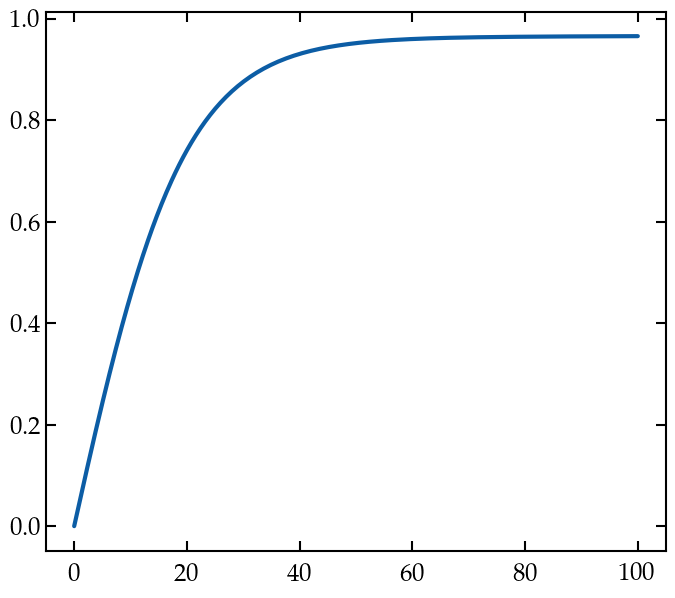

In [220]:
N = 1000

t, jz, _ = on.solve(N, gp_ratio=0.9, gd_ratio=0, ti=1e-2, tf=100,ntimes=500)
plt.plot(t, -(jz)/N*2, c='C0')

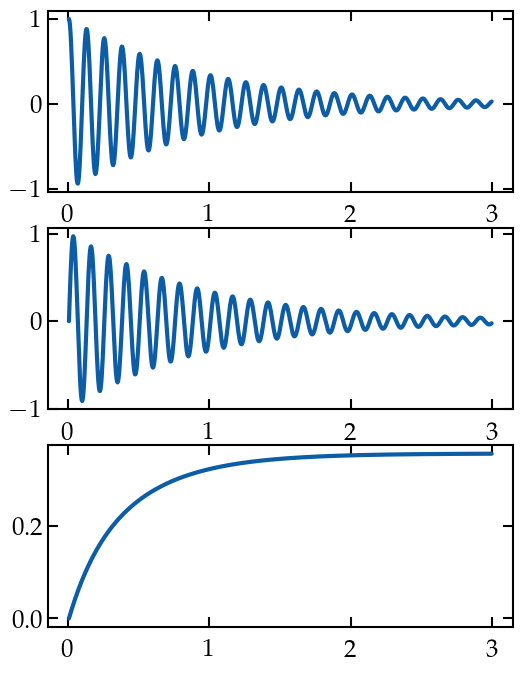

In [197]:
fig, ax = plt.subplots(3,1,figsize=(6,8))

J = N / 2  # Total spin = 10
sx = jx / J
sy = jy / J
sz = jz / J

ax[0].plot(t[:], sx[:])
ax[1].plot(t[:], sy[:])
ax[2].plot(t[:], -sz[:])
#ax[0].set_xlim(-0.075, 1.1)
#ax[2].set_ylim(1e-5, 1)

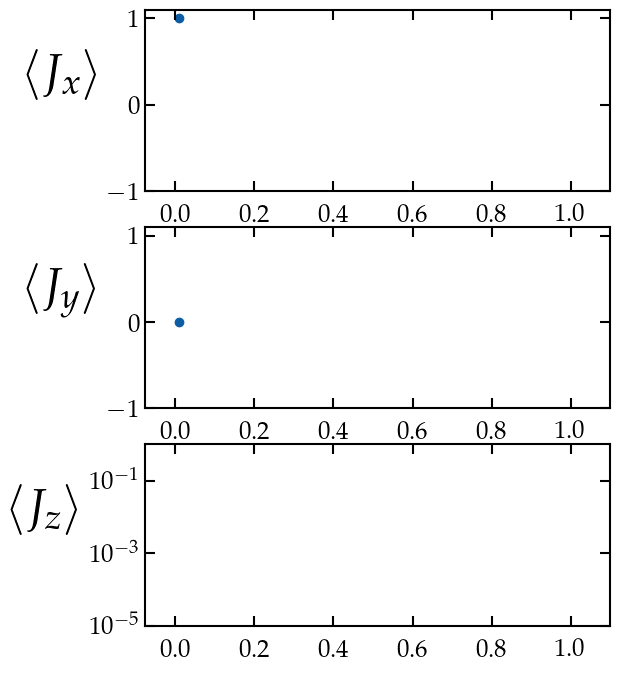

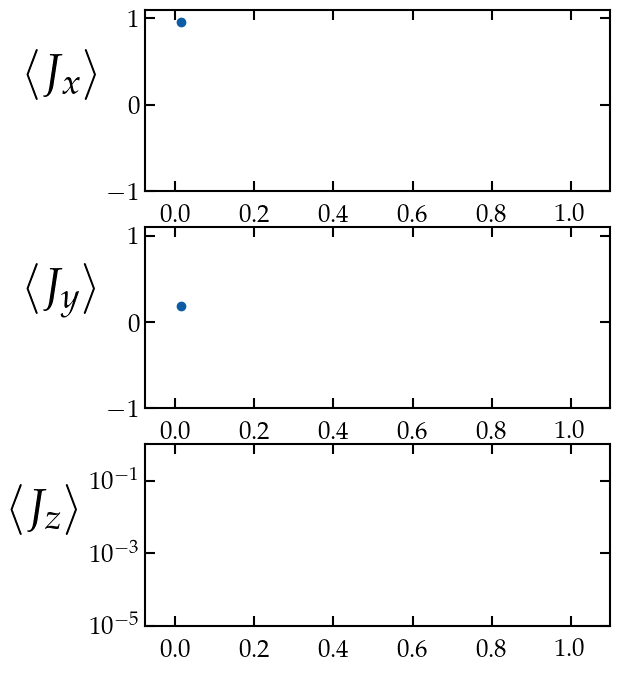

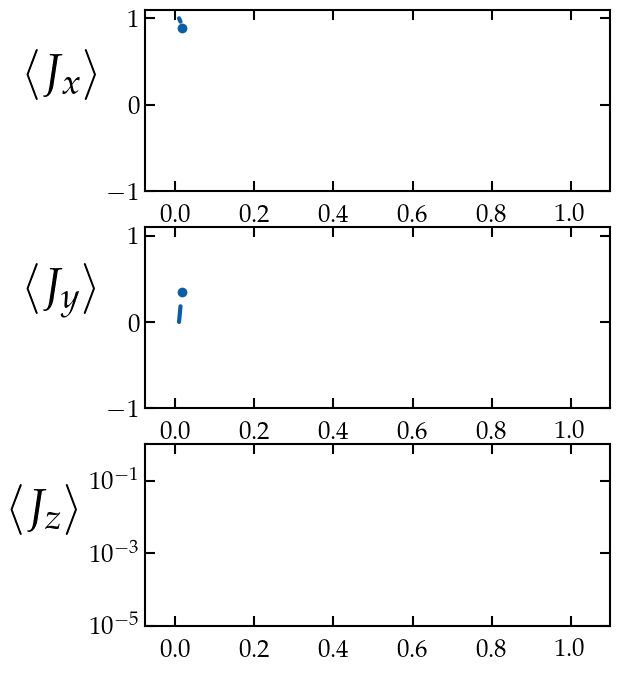

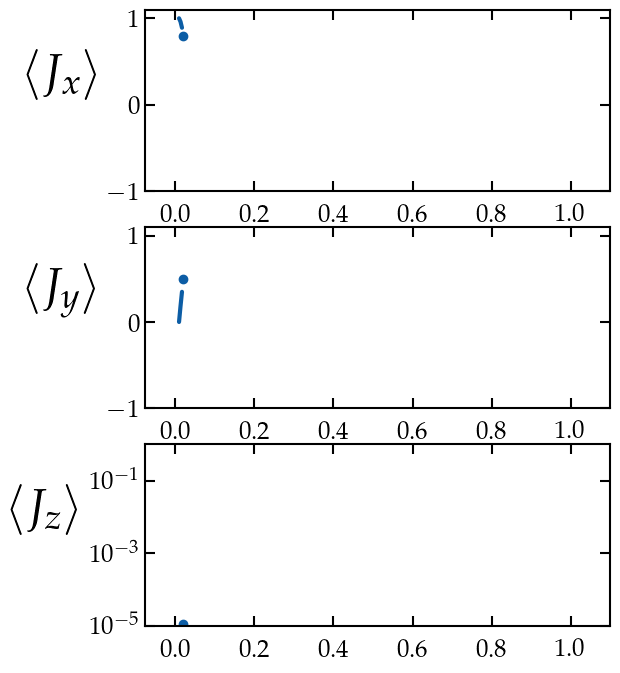

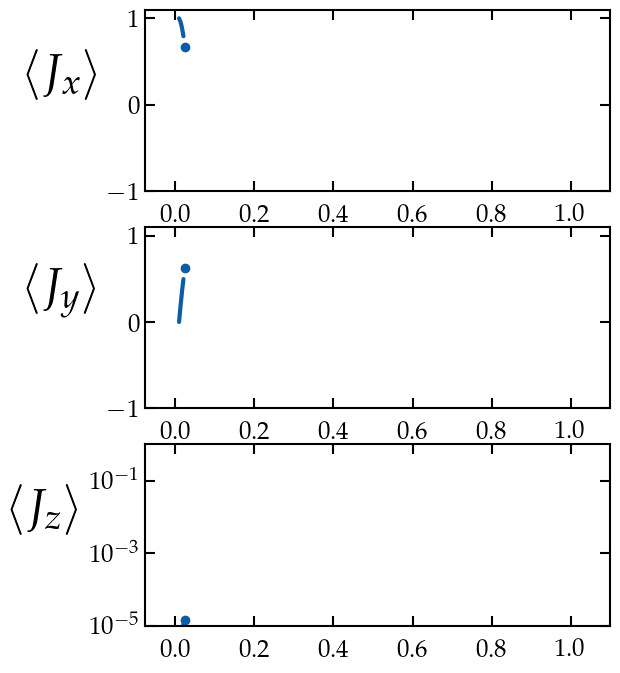

...

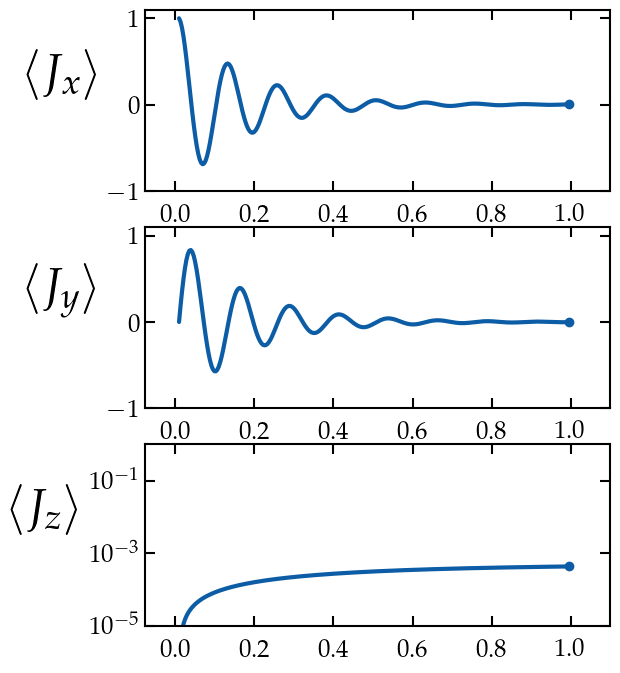

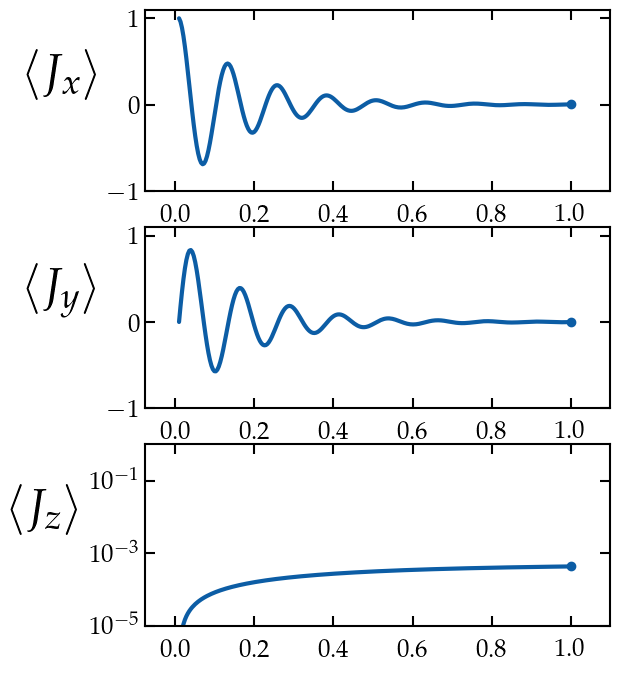

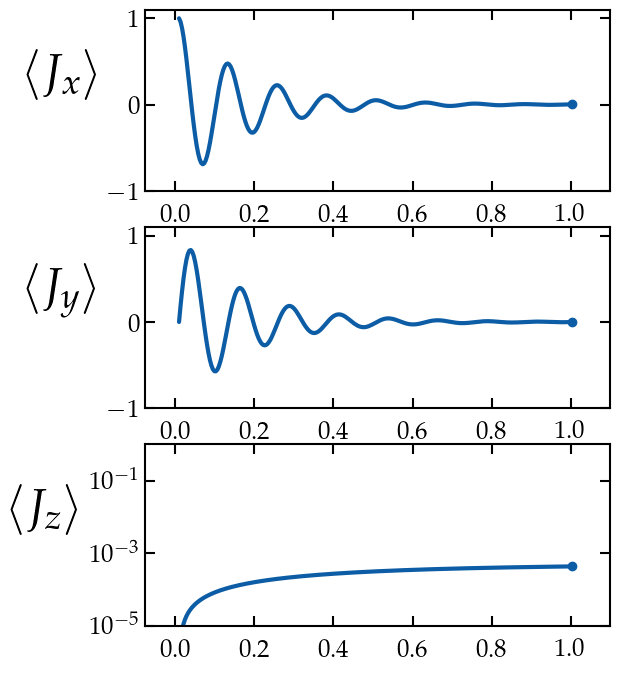

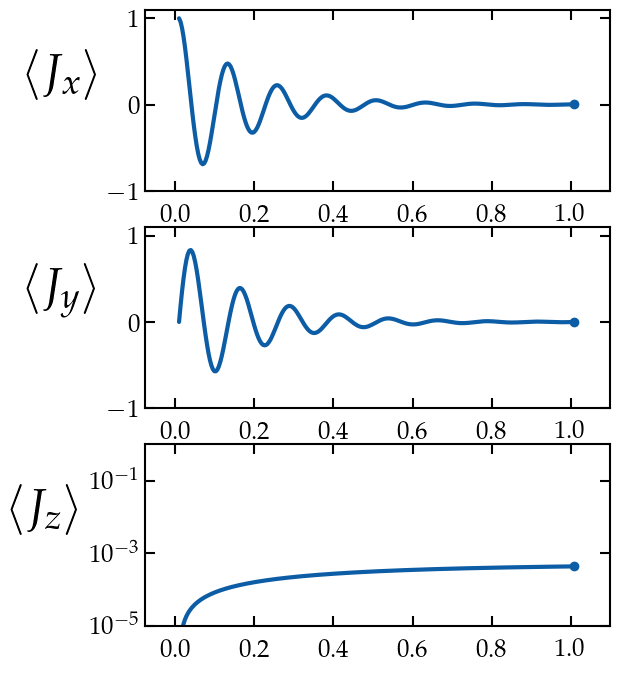

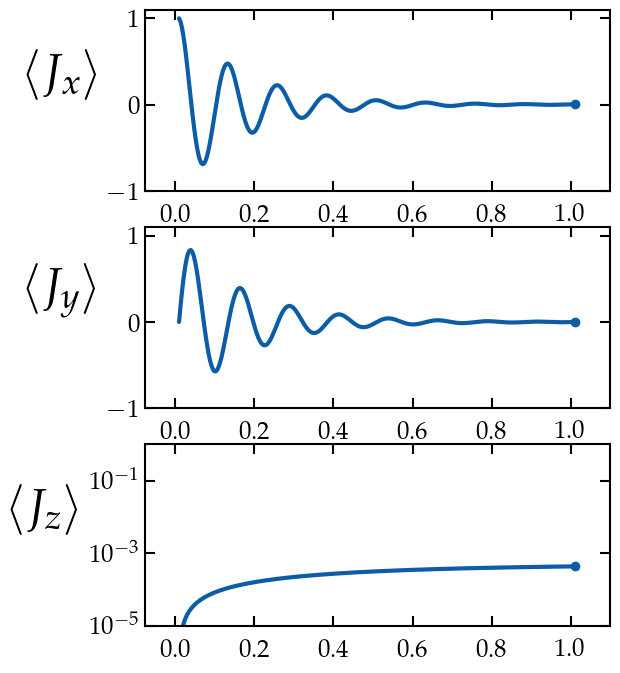

In [169]:
out_dir = "../plots/xyz_3"
os.makedirs(out_dir, exist_ok=True)

for k in range(270):    
    fig, ax = plt.subplots(3,1,figsize=(6,8))
    
    J = N / 2  # Total spin = 10
    sx = jx / J
    sy = jy / J
    sz = jz / J
    
    ax[0].plot(t[:k], sx[:k])
    ax[1].plot(t[:k], sy[:k])
    ax[2].semilogy(t[:k], -sz[:k])

    ax[0].scatter(t[k], sx[k])
    ax[1].scatter(t[k], sy[k])
    ax[2].scatter(t[k], -sz[k])
    
    for i in range(3):
        ax[i].set_xlim(-0.075, 1.1)
        ax[i].set_ylim(-1, 1.1)
        #ax[i].set_xticks([])
        #ax[i].set_yticks([])
        #ax[i].plot(t,t/t, c='k', ls='--', lw=1.5, alpha=0.5)
        #ax[i].text(1,0.72,r'$N/2$')
    ax[2].set_ylim(1e-5, 1)
    lp = 30
    ax[0].set_ylabel(r'$\langle J_x\rangle$', rotation=0, labelpad=lp)
    ax[1].set_ylabel(r'$\langle J_y\rangle$', rotation=0, labelpad=lp)
    ax[2].set_ylabel(r'$\langle J_z\rangle$', rotation=0, labelpad=lp)
    
    filename = os.path.join(out_dir, f"sol_frame_{k:03d}.png")
    fig.savefig(filename, bbox_inches='tight', pad_inches=0)

In [67]:
mkdir ../plots/xyz_bloch

(-0.075, 1.0)

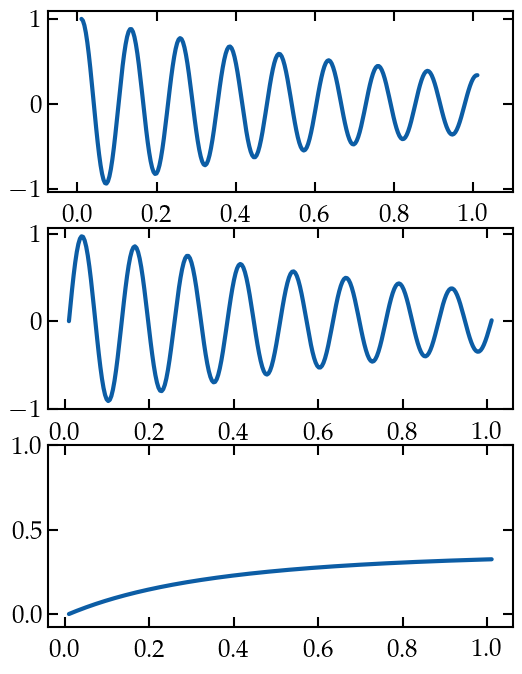

In [131]:
sy[:10]

array([0.        , 0.18245815, 0.35194956, 0.50309113, 0.63133041,
       0.73307251, 0.80576935, 0.84796956, 0.85932849, 0.84057977])

In [170]:
out_dir = "../plots/xyz_bloch_3"
os.makedirs(out_dir, exist_ok=True)

# for i in range(5):
for i in range(270):
    fig = plt.figure(figsize=(6, 6)) 
    b = Bloch(fig=fig)                      
    b = myBloch('#004f98')

    #b.add_points([sx[:i], sy[:i], sz[:i]], meth='l')
    b.add_vectors([[sx[i], sy[i], sz[i]]])
    b.render()
    filename = os.path.join(out_dir, f"frame_{i:03d}.png")
    b.fig.savefig(filename, dpi=362, bbox_inches='tight', pad_inches=0)
    plt.close(fig)  # avoid memory bloat}

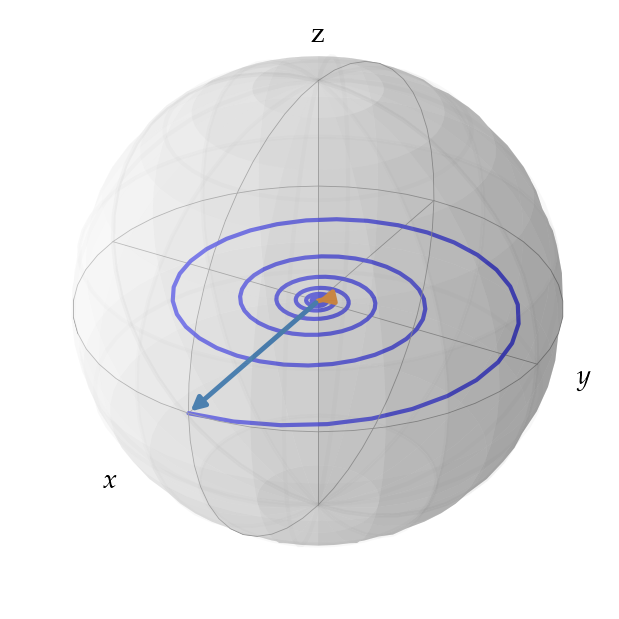

In [121]:
b = myBloch()
b.add_points([sx, sy, sz], meth='l')  # Plot trajectory as a line
b.add_vectors([sx[0], sy[0], sz[0]])  # Initial vector
b.add_vectors([sx[-1], sy[-1], sz[-1]])  # Final vector
b.show()

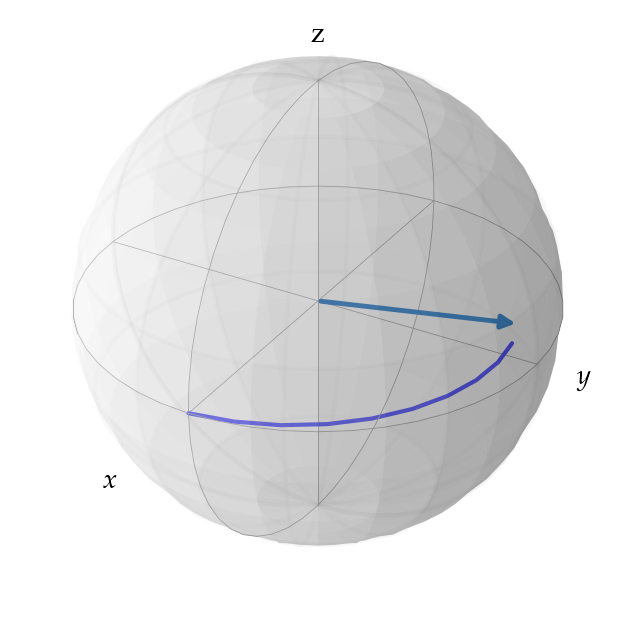

In [137]:
b = myBloch()
i = 10
b.add_points([sx[:i], sy[:i], sz[:i]], meth='l')
b.add_vectors([[sx[i], sy[i], sz[i]]])
b.show()